In [1]:
import tensorflow as tf
import numpy as np
from bfseg.utils.evaluation import scoreAndPlotPredictions

In [109]:
from bfseg.utils.metrics import IgnorantBalancedMeanIoU, IgnorantMeanIoU, IgnorantBalancedAccuracyMetric, \
  IgnorantAccuracyMetric
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np


def oneMetricIteration(metric, label, pred):
  """ Helper function to get the result from one prediction """
  metric.update_state(label, pred)
  res = metric.result().numpy()
  metric.reset_states()
  return res



In [13]:
import re

In [2]:
import matplotlib.pyplot as plt

In [10]:
validLabels = DL.validationLabels

In [11]:
names = []

In [33]:
ts

'1582125491.108546'

In [40]:
import os 

cam0_1582125534.167660_semseg.png


,0000,1582125462.069531;
0,1,1582125462.269446;
1,2,1582125462.469361;
2,3,1582125462.669276;
3,4,1582125462.869191;
4,5,1582125463.074864;
...,...,...
738,739,1582125610.059849;
739,740,1582125610.259455;
740,741,1582125610.459464;
741,742,1582125610.659317;


In [63]:
np.sum(pd.read_csv(info_file, header=None, sep=',|;', engine="python").to_numpy()[:,-2] == ts)

0

In [61]:
np.argmax(pd.read_csv(info_file, header=None, sep=',|;', engine="python").to_numpy()[:,-2] == ts)

0

[('/home/rene/hiveLabels/cam0_1582125491.108546/cam0_1582125491.108546_semseg.png',
  '/home/rene/cla_dataset/fused/cam0_img_0145/cam0_img_0145_semseg.png'),
 ('/home/rene/hiveLabels/cam0_1582125504.719688/cam0_1582125504.719688_semseg.png',
  '/home/rene/cla_dataset/fused/cam0_img_0213/cam0_img_0213_semseg.png'),
 ('/home/rene/hiveLabels/cam0_1582125534.167660/cam0_1582125534.167660_semseg.png',
  '/home/rene/cla_dataset/fused/cam0_img_0360/cam0_img_0360_semseg.png'),
 ('/home/rene/hiveLabels/cam0_1582125550.010422/cam0_1582125550.010422_semseg.png',
  '/home/rene/cla_dataset/fused/cam0_img_0439/cam0_img_0439_semseg.png'),
 ('/home/rene/hiveLabels/cam0_1582125563.402524/cam0_1582125563.402524_semseg.png',
  '/home/rene/cla_dataset/fused/cam0_img_0506/cam0_img_0506_semseg.png'),
 ('/home/rene/hiveLabels/cam0_1582125571.847036/cam0_1582125571.847036_semseg.png',
  '/home/rene/cla_dataset/fused/cam0_img_0548/cam0_img_0548_semseg.png'),
 ('/home/rene/hiveLabels/cam0_1582125577.842974/cam0

In [72]:
images = []
for label in validLabels:
    regex_pattern = "(.+)_(\d+\.\d+)_semseg\.png"
    print(os.path.basename(label))
    match = re.search(regex_pattern, os.path.basename(label))
    cam = match.group(1)
    ts = float(match.group(2))
    info_file = os.path.join("/home/rene/cla_dataset/fused", f"{cam}_info.txt")
    if(np.sum(pd.read_csv(info_file, header=None, sep=',|;', engine="python").to_numpy()[:,-2] == ts)):
        print("found image for ", label)
        idx = np.argmax(pd.read_csv(info_file, header=None, sep=',|;', engine="python").to_numpy()[:,-2] == ts)
        print("index", idx)
        img_path = [ l for l in DL.labels if cam + "_img_"+(str(idx).zfill(4)) in l][0]
        images.append((label, img_path))

cam0_1582125491.108546_semseg.png
found image for  /home/rene/hiveLabels/cam0_1582125491.108546/cam0_1582125491.108546_semseg.png
index 145
cam0_1582125504.719688_semseg.png
found image for  /home/rene/hiveLabels/cam0_1582125504.719688/cam0_1582125504.719688_semseg.png
index 213
cam0_1582125534.167660_semseg.png
found image for  /home/rene/hiveLabels/cam0_1582125534.167660/cam0_1582125534.167660_semseg.png
index 360
cam0_1582125550.010422_semseg.png
found image for  /home/rene/hiveLabels/cam0_1582125550.010422/cam0_1582125550.010422_semseg.png
index 439
cam0_1582125563.402524_semseg.png
found image for  /home/rene/hiveLabels/cam0_1582125563.402524/cam0_1582125563.402524_semseg.png
index 506
cam0_1582125571.847036_semseg.png
found image for  /home/rene/hiveLabels/cam0_1582125571.847036/cam0_1582125571.847036_semseg.png
index 548
cam0_1582125577.842974_semseg.png
found image for  /home/rene/hiveLabels/cam0_1582125577.842974/cam0_1582125577.842974_semseg.png
index 578
cam0_1582125593.2763

In [214]:
len(images)

14

In [210]:
iam = IgnorantAccuracyMetric()
ibm = IgnorantBalancedAccuracyMetric()

MIOUM_B = IgnorantBalancedMeanIoU()
MIOUM = IgnorantMeanIoU()

iam_valid = IgnorantAccuracyMetric()
ibm_valid = IgnorantBalancedAccuracyMetric()

MIOUM_B_valid = IgnorantBalancedMeanIoU()
MIOUM_valid = IgnorantMeanIoU()
masked = True

for gt, img in images:
    img_np = np.asarray(Image.open(img))
    pseudo_masked = img_np
    pseudo_labels_unknown_background = img_np > 0
    #pseudo_labels_unknown_fg = img_np > 1
    
    img_np = np.asarray(Image.open(gt).resize((img_np.shape[1], img_np.shape[0]), Image.NEAREST))
    gt_labels = np.sum(img_np, axis = -1) > 0
    
    
   
    gt_labels_ignorant = gt_labels * 2
    if masked:
        gt_labels_ignorant[pseudo_masked == 1] = 1

    # Update Accuracy metrics
    pseudo_labels_cat = tf.keras.utils.to_categorical(
        tf.convert_to_tensor(pseudo_labels_unknown_background), num_classes=3, dtype='float32'
    )
#     iam_value = oneMetricIteration(iam, gt_labels_ignorant, pseudo_labels_cat)
#     ibm_value = oneMetricIteration(ibm, gt_labels_ignorant, pseudo_labels_cat)
#     miou = oneMetricIteration(MIOUM, gt_labels_ignorant, pseudo_labels_cat)
#     print('iam', iam_value)
#     print('ibm',ibm_value)
#     print('miou', miou)

    iam_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    ibm_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    MIOUM_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    
iam_valid_value = iam_valid.result().numpy()
MIOUM_valid_value = MIOUM_valid.result().numpy()
ibm_valid_value = ibm_valid.result().numpy()

print("Accuracy on validation set:", iam_valid_value)
print("Balanced Accuracy on validation set:", ibm_valid_value)
print("mIoU on validation set:", MIOUM_valid_value)


Accuracy on validation set: 0.8665399
Balanced Accuracy on validation set: 0.78035957
mIoU on validation set: 0.6931578


In [211]:
iam = IgnorantAccuracyMetric()
ibm = IgnorantBalancedAccuracyMetric()

MIOUM_B = IgnorantBalancedMeanIoU()
MIOUM = IgnorantMeanIoU()

iam_valid = IgnorantAccuracyMetric()
ibm_valid = IgnorantBalancedAccuracyMetric()

MIOUM_B_valid = IgnorantBalancedMeanIoU()
MIOUM_valid = IgnorantMeanIoU()
masked = False

for gt, img in images:
    img_np = np.asarray(Image.open(img))
    pseudo_masked = img_np
    pseudo_labels_unknown_background = img_np > 0
    #pseudo_labels_unknown_fg = img_np > 1
    
    img_np = np.asarray(Image.open(gt).resize((img_np.shape[1], img_np.shape[0]), Image.NEAREST))
    gt_labels = np.sum(img_np, axis = -1) > 0
    
    
   
    gt_labels_ignorant = gt_labels * 2
    if masked:
        gt_labels_ignorant[pseudo_masked == 1] = 1

    # Update Accuracy metrics
    pseudo_labels_cat = tf.keras.utils.to_categorical(
        tf.convert_to_tensor(pseudo_labels_unknown_background), num_classes=3, dtype='float32'
    )
#     iam_value = oneMetricIteration(iam, gt_labels_ignorant, pseudo_labels_cat)
#     ibm_value = oneMetricIteration(ibm, gt_labels_ignorant, pseudo_labels_cat)
#     miou = oneMetricIteration(MIOUM, gt_labels_ignorant, pseudo_labels_cat)
#     print('iam', iam_value)
#     print('ibm',ibm_value)
#     print('miou', miou)

    iam_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    ibm_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    MIOUM_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    
iam_valid_value = iam_valid.result().numpy()
MIOUM_valid_value = MIOUM_valid.result().numpy()
ibm_valid_value = ibm_valid.result().numpy()

print("Accuracy on validation set:", iam_valid_value)
print("Balanced Accuracy on validation set:", ibm_valid_value)
print("mIoU on validation set:", MIOUM_valid_value)


Accuracy on validation set: 0.75086814
Balanced Accuracy on validation set: 0.5890446
mIoU on validation set: 0.46131268


In [213]:
iam = IgnorantAccuracyMetric()
ibm = IgnorantBalancedAccuracyMetric()

MIOUM_B = IgnorantBalancedMeanIoU()
MIOUM = IgnorantMeanIoU()

iam_valid = IgnorantAccuracyMetric()
ibm_valid = IgnorantBalancedAccuracyMetric()

MIOUM_B_valid = IgnorantBalancedMeanIoU()
MIOUM_valid = IgnorantMeanIoU()
masked = False

for gt, img in images:
    img_np = np.asarray(Image.open(img))
    pseudo_masked = img_np
    #pseudo_labels_unknown_background = img_np > 0
    pseudo_labels_unknown_fg = img_np > 1
    
    img_np = np.asarray(Image.open(gt).resize((img_np.shape[1], img_np.shape[0]), Image.NEAREST))
    gt_labels = np.sum(img_np, axis = -1) > 0
    
    
   
    gt_labels_ignorant = gt_labels * 2
    if masked:
        gt_labels_ignorant[pseudo_masked == 1] = 1

    # Update Accuracy metrics
    pseudo_labels_cat = tf.keras.utils.to_categorical(
        tf.convert_to_tensor(pseudo_labels_unknown_fg), num_classes=3, dtype='float32'
    )
#     iam_value = oneMetricIteration(iam, gt_labels_ignorant, pseudo_labels_cat)
#     ibm_value = oneMetricIteration(ibm, gt_labels_ignorant, pseudo_labels_cat)
#     miou = oneMetricIteration(MIOUM, gt_labels_ignorant, pseudo_labels_cat)
#     print('iam', iam_value)
#     print('ibm',ibm_value)
#     print('miou', miou)

    iam_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    ibm_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    MIOUM_valid.update_state(gt_labels_ignorant, pseudo_labels_cat)
    
iam_valid_value = iam_valid.result().numpy()
MIOUM_valid_value = MIOUM_valid.result().numpy()
ibm_valid_value = ibm_valid.result().numpy()

print("Accuracy on validation set:", iam_valid_value)
print("Balanced Accuracy on validation set:", ibm_valid_value)
print("mIoU on validation set:", MIOUM_valid_value)


Accuracy on validation set: 0.5115174
Balanced Accuracy on validation set: 0.61108446
mIoU on validation set: 0.3436405


In [115]:
gt_labels.shape

(624, 1104)

In [116]:
pseudo_labels_unknown_background.shape

(624, 1104)

In [77]:
from PIL import Image

In [27]:
import pandas as pd

In [198]:
iimg = np.asarray(Image.open(gt.replace("semseg", "img")).resize((img_np.shape[1], img_np.shape[0]), Image.NEAREST))

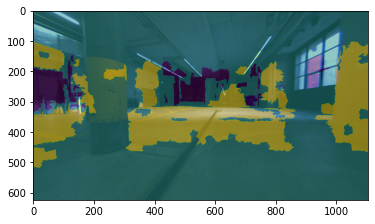

In [200]:
plt.imshow(iimg)
plt.imshow(pseudo_masked, alpha = 0.5)

In [118]:
pseudo_labels_unknown_background.shape

(624, 1104)

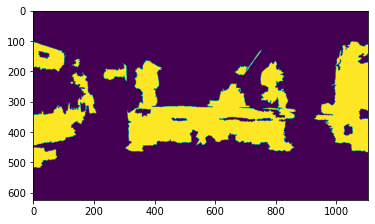

In [188]:
plt.imshow(pseudo_masked == 2)

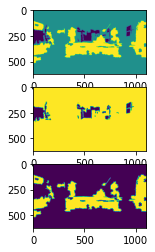

In [192]:
plt.subplot(3,1,1)
plt.imshow(pseudo_masked)
plt.subplot(3,1,2)
plt.imshow(pseudo_labels_unknown_background)
plt.subplot(3,1,3)
plt.imshow(pseudo_labels_unknown_fg)

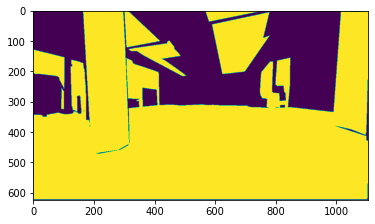

In [180]:
plt.imshow(gt_labels)

In [120]:
import tensorflow as tf

iam 0.87259275
ibm 0.79242635
miou 0.70555496


<tf.Variable 'UnreadVariable' shape=(2, 2) dtype=float64, numpy=
array([[ 30333.,  18413.],
       [  5073., 130519.]])>

In [136]:
iam_value

1.0

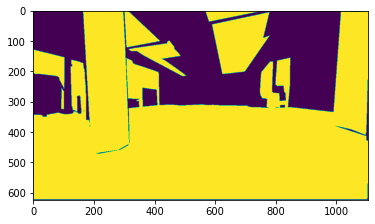

In [176]:
plt.imshow(gt_labels*2)

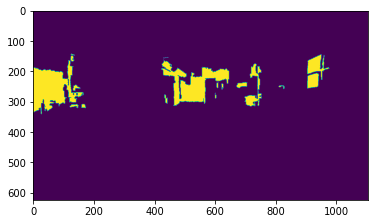

In [177]:
plt.imshow(pseudo_labels_unknown_background*2)

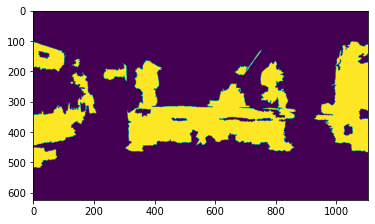

In [104]:
plt.imshow(pseudo_labels_unknown_fg)

In [3]:
import tensorflow as tf
import numpy as np
from bfseg.utils.evaluation import scoreAndPlotPredictions
from bfseg.models import DeeplabV3Plus


model = tf.keras.models.load_model('/home/rene/dl_w_depth.h5', custom_objects={'tf': tf})

In [169]:
from bfseg.utils.losses import smooth_consistency_loss

In [2]:
model = tf.keras.models.load_model('/home/rene/best_PSP_model.h5', custom_objects={'tf': tf})

In [4]:

from bfseg.data.meshdist.dataLoader import DataLoader

In [5]:
DL = DataLoader(
          "/home/rene/cla_dataset/fused", [480, 624],
          validationDir="/home/rene/hiveLabels",
          validationMode="CLA",
          batchSize=1,
          loadDepth=False,
          cropOptions={
              'top': 0,
              'bottom': 0
          })

In [6]:
for i,l in DL.getValidationDataset().take(1):
    break

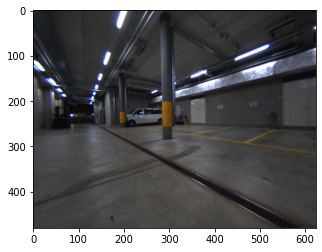

In [20]:
plt.imshow(np.squeeze(i.numpy()))

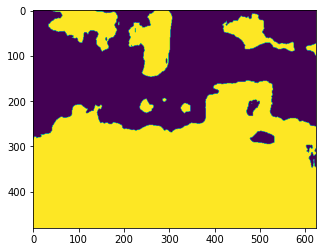

In [21]:
plt.imshow(np.squeeze(np.argmax(model.predict(i)[1], axis = -1)))

In [ ]:
plt.imshow(np.squeeze(i.numpy()))

In [26]:
def pred(img):
    return model.predict(img)[1]
    #return  model.predict(img)
    #return  np.random.rand(1,480,720,2)
    #return prediction

In [26]:
def pred_all_0(img):
    #prediction =  model.predict(img)
    vec =   np.random.rand(1,480,720,2)
    vec[...,0] = 10
    return vec
    #return prediction

In [24]:
def pred_all_1(img):
    #prediction =  model.predict(img)
    vec =   np.random.rand(1,480,720,2)
    vec[...,1] = 10
    return vec
    #return prediction

Accuracy on validation set: 0.7082343
Balanced Accuracy on validation set: 0.722063
mIoU on validation set: 0.53924286
Balanced mIoU on validation set: 0.5643256
Positive = Foreground, Negative = Background
TPR on validation set: 0.67437553
TNR on validation set: 0.77371156
Precision  on validation set: 0.85213953


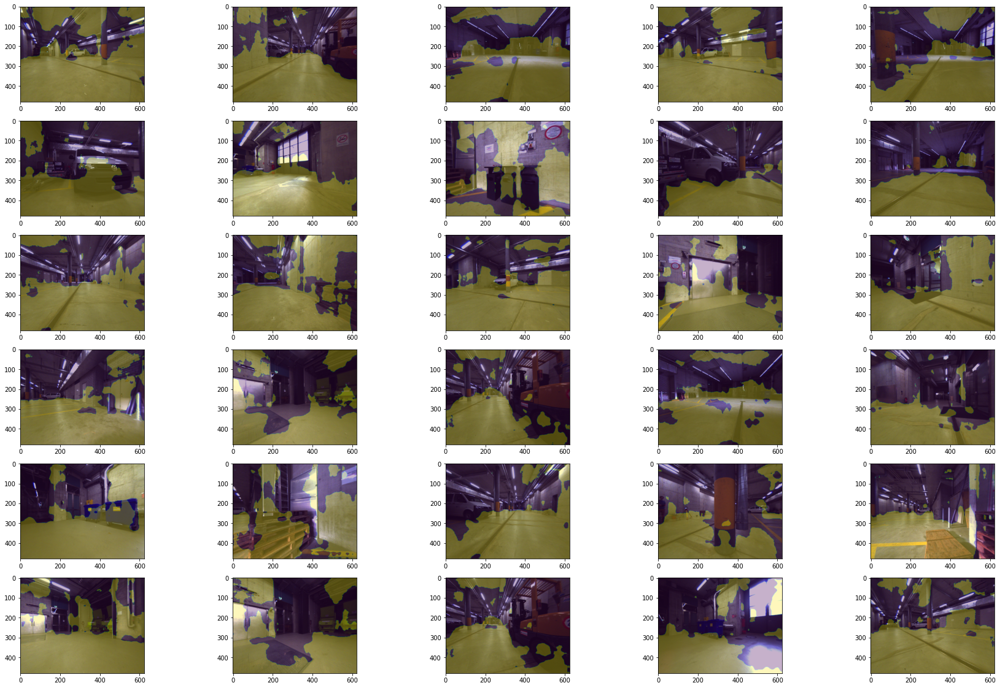

In [27]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,20)

scoreAndPlotPredictions(pred,
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 


In [8]:
DL = DataLoader(
          "/home/rene/cla_dataset/fused", [480, 720],
          validationDir="/home/rene/hiveLabels",
          validationMode="ARCHE",
          batchSize=1,
          loadDepth=False,
          cropOptions={
              'top': 0,
              'bottom': 0
          })

Accuracy on validation set: 0.6382899
Balanced Accuracy on validation set: 0.6388119
mIoU on validation set: 0.46610188
Balanced mIoU on validation set: 0.46858248
Positive = Foreground, Negative = Background
TPR on validation set: 0.60106134
TNR on validation set: 0.6966703
Precision  on validation set: 0.75653577


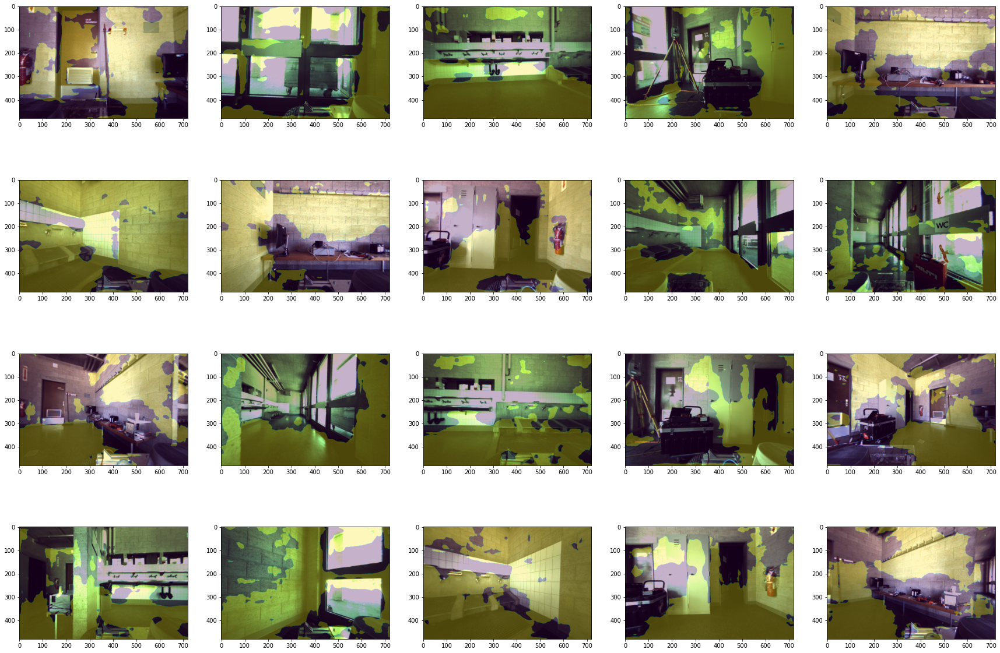

In [10]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,21)

scoreAndPlotPredictions(lambda x: model.predict(x),
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 


Accuracy on validation set: 0.50059384
Balanced Accuracy on validation set: 0.50111234
mIoU on validation set: 0.3265774
Balanced mIoU on validation set: 0.3343222
Positive = Foreground, Negative = Background
TPR on validation set: 0.4997192
TNR on validation set: 0.5022685
Precision  on validation set: 0.6578015


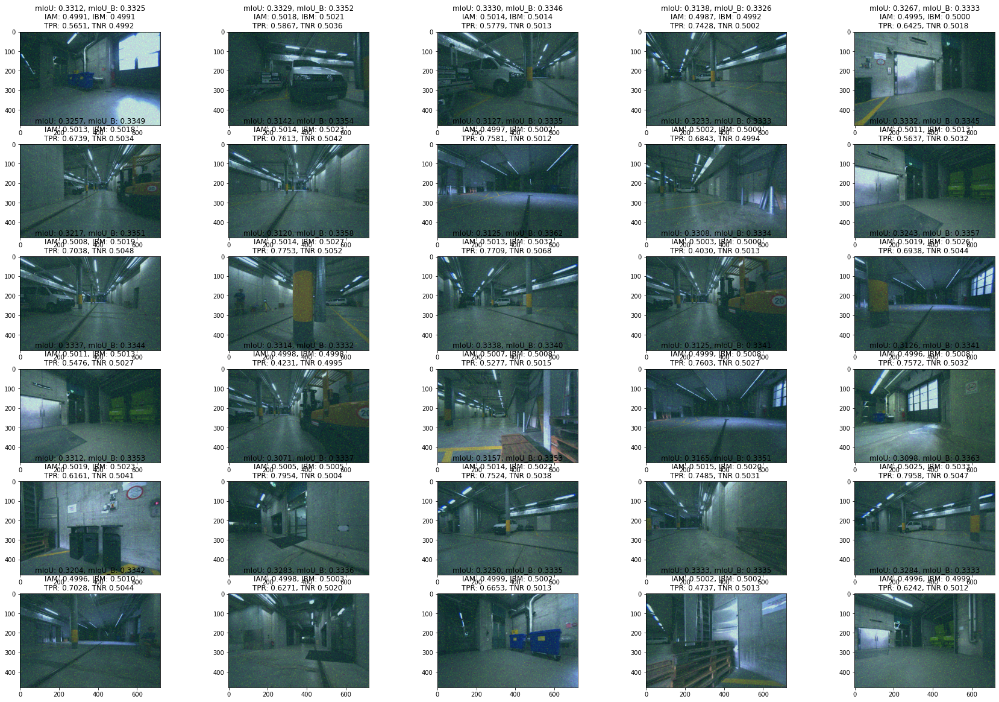

In [18]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,20)

scoreAndPlotPredictions(pred_all_0,
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 


Accuracy on validation set: 0.49994057
Balanced Accuracy on validation set: 0.49987686
mIoU on validation set: 0.32589626
Balanced mIoU on validation set: 0.33322388
Positive = Foreground, Negative = Background
TPR on validation set: 0.50002784
TNR on validation set: 0.49977356
Precision  on validation set: 0.65681434


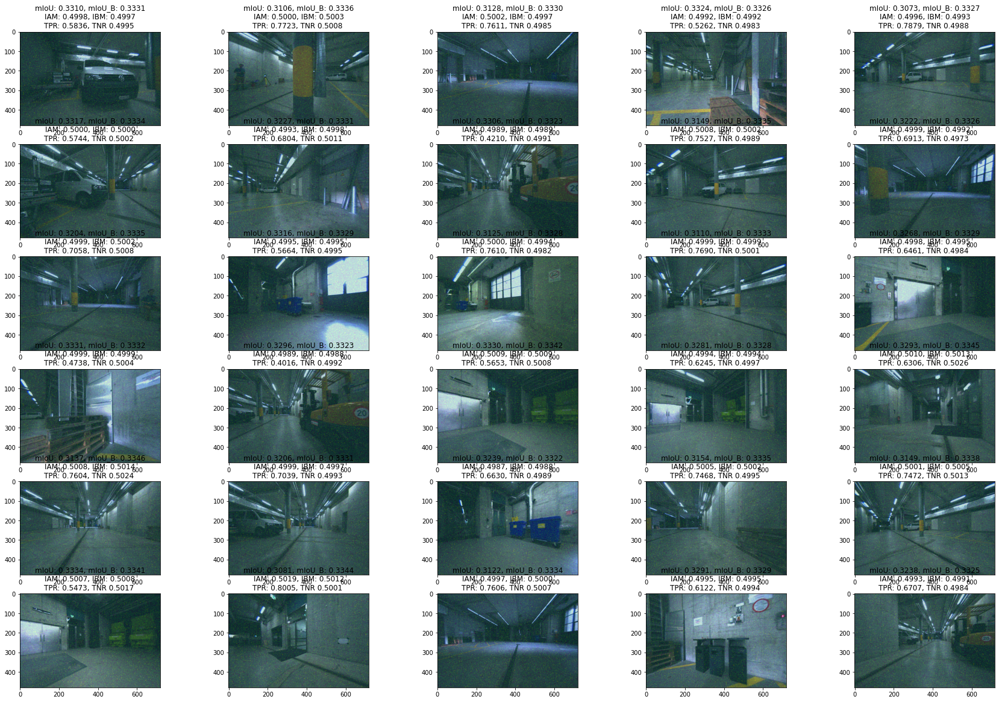

In [14]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,20)

scoreAndPlotPredictions(pred,
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 


Accuracy on validation set: 0.80045563
Balanced Accuracy on validation set: 0.78719544
mIoU on validation set: 0.6485554
Balanced mIoU on validation set: 0.64884824
Positive = Foreground, Negative = Background
TPR on validation set: 0.82012236
TNR on validation set: 0.76280105
Precision  on validation set: 0.8687648


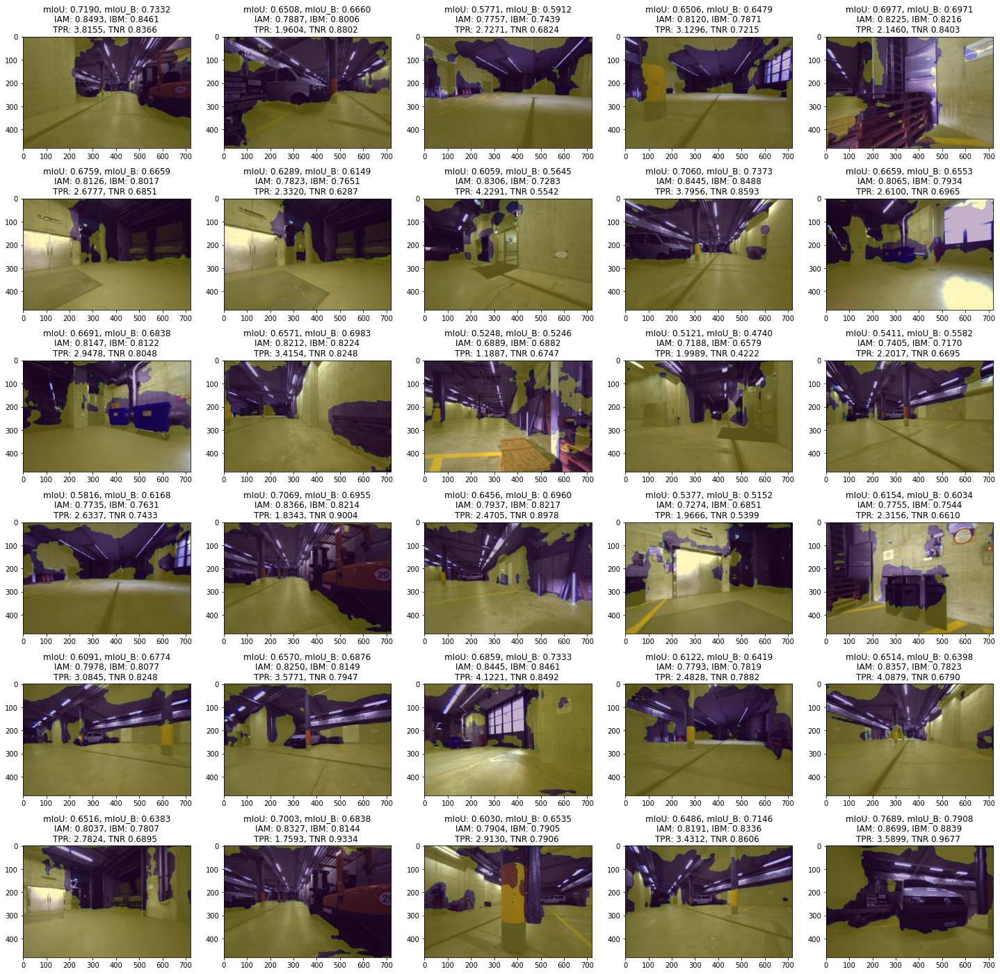

In [16]:
import matplotlib.pyplot as plt

def pred(img):
    prediction = model(img)
    prediction = tf.stack([prediction[...,0], prediction[...,1] + 0], axis = -1).numpy()
    return prediction

plt.rcParams["figure.figsize"] = (25,25)
scoreAndPlotPredictions(pred,
                        DL.getValidationDataset(),
                        DL.validationSize,
                        plot=True,
                        outFolder=None,
                        tag="CLA",
                        exportPredictions=False) 

